**Loading the Dataset & Libraries**




In [ ]:
import pandas as pd
import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import tensorflow as tf
import plotly.express as px

In [ ]:
df = pd.read_csv("/content/weather10.csv")

In [ ]:
df

,YEAR,MO,DY,HR,T2M,T2MDEW,QV2M,PS,WS10M
0,2014,4,21,5,25.23,20.66,15.38,99.78,1.63
1,2014,4,21,6,26.73,20.12,14.83,99.82,2.08
2,2014,4,21,7,30.34,17.56,12.63,99.86,2.09
3,2014,4,21,8,34.13,15.35,10.93,99.88,1.74
4,2014,4,21,9,37.22,13.30,9.58,99.86,1.42
...,...,...,...,...,...,...,...,...,...
87547,2024,4,16,0,30.75,19.96,14.59,99.80,2.04
87548,2024,4,16,1,30.50,19.59,14.28,99.77,2.17
87549,2024,4,16,2,30.19,19.42,14.10,99.74,2.31
87550,2024,4,16,3,29.76,19.37,14.04,99.72,2.39




---



**DATA PREPROCESSING**

In [ ]:
df.describe()

,YEAR,MO,DY,HR,T2M,T2MDEW,QV2M,PS,WS10M
count,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000
mean,2018.795801,6.525768,15.728059,11.500000,26.864236,19.007482,14.678509,99.799935,3.487819
std,2.904890,3.449990,8.806292,6.922226,5.104102,6.145411,4.839595,0.371764,1.821625
min,2014.000000,1.000000,1.000000,0.000000,9.480000,-7.810000,2.080000,98.080000,0.020000
25%,2016.000000,4.000000,8.000000,5.750000,24.130000,14.830000,10.560000,99.530000,2.160000
50%,2019.000000,7.000000,16.000000,11.500000,26.500000,20.900000,15.560000,99.820000,3.100000
75%,2021.000000,10.000000,23.000000,17.250000,29.480000,24.270000,19.170000,100.080000,4.580000
max,2024.000000,12.000000,31.000000,23.000000,44.910000,27.000000,22.640000,100.900000,16.330000


In [ ]:
df.insert(0, 'index', range(1, len(df) + 1))
df

,index,YEAR,MO,DY,HR,T2M,T2MDEW,QV2M,PS,WS10M
0,1,2014,4,21,5,25.23,20.66,15.38,99.78,1.63
1,2,2014,4,21,6,26.73,20.12,14.83,99.82,2.08
2,3,2014,4,21,7,30.34,17.56,12.63,99.86,2.09
3,4,2014,4,21,8,34.13,15.35,10.93,99.88,1.74
4,5,2014,4,21,9,37.22,13.30,9.58,99.86,1.42
...,...,...,...,...,...,...,...,...,...,...
87547,87548,2024,4,16,0,30.75,19.96,14.59,99.80,2.04
87548,87549,2024,4,16,1,30.50,19.59,14.28,99.77,2.17
87549,87550,2024,4,16,2,30.19,19.42,14.10,99.74,2.31
87550,87551,2024,4,16,3,29.76,19.37,14.04,99.72,2.39


In [ ]:
df.shape

(87552, 10)

In [ ]:
df.rename(columns={'T2M': 'Temperature', 'T2MDEW': 'Dew', 'QV2M': 'Humidity', 'PS': 'Pressure', 'WS10M': 'WindSpeed'}, inplace=True)
df

,index,YEAR,MO,DY,HR,Temperature,Dew,Humidity,Pressure,WindSpeed
0,1,2014,4,21,5,25.23,20.66,15.38,99.78,1.63
1,2,2014,4,21,6,26.73,20.12,14.83,99.82,2.08
2,3,2014,4,21,7,30.34,17.56,12.63,99.86,2.09
3,4,2014,4,21,8,34.13,15.35,10.93,99.88,1.74
4,5,2014,4,21,9,37.22,13.30,9.58,99.86,1.42
...,...,...,...,...,...,...,...,...,...,...
87547,87548,2024,4,16,0,30.75,19.96,14.59,99.80,2.04
87548,87549,2024,4,16,1,30.50,19.59,14.28,99.77,2.17
87549,87550,2024,4,16,2,30.19,19.42,14.10,99.74,2.31
87550,87551,2024,4,16,3,29.76,19.37,14.04,99.72,2.39


In [ ]:
df['datetime'] = pd.to_datetime(df['YEAR'].astype(str) + '-' + df['MO'].astype(str) + '-' + df['DY'].astype(str) + ' ' + df['HR'].astype(str) + ':00:00')
df

,index,YEAR,MO,DY,HR,Temperature,Dew,Humidity,Pressure,WindSpeed,datetime
0,1,2014,4,21,5,25.23,20.66,15.38,99.78,1.63,2014-04-21 05:00:00
1,2,2014,4,21,6,26.73,20.12,14.83,99.82,2.08,2014-04-21 06:00:00
2,3,2014,4,21,7,30.34,17.56,12.63,99.86,2.09,2014-04-21 07:00:00
3,4,2014,4,21,8,34.13,15.35,10.93,99.88,1.74,2014-04-21 08:00:00
4,5,2014,4,21,9,37.22,13.30,9.58,99.86,1.42,2014-04-21 09:00:00
...,...,...,...,...,...,...,...,...,...,...,...
87547,87548,2024,4,16,0,30.75,19.96,14.59,99.80,2.04,2024-04-16 00:00:00
87548,87549,2024,4,16,1,30.50,19.59,14.28,99.77,2.17,2024-04-16 01:00:00
87549,87550,2024,4,16,2,30.19,19.42,14.10,99.74,2.31,2024-04-16 02:00:00
87550,87551,2024,4,16,3,29.76,19.37,14.04,99.72,2.39,2024-04-16 03:00:00


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87552 entries, 0 to 87551
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   index        87552 non-null  int64         
 1   YEAR         87552 non-null  int64         
 2   MO           87552 non-null  int64         
 3   DY           87552 non-null  int64         
 4   HR           87552 non-null  int64         
 5   Temperature  87552 non-null  float64       
 6   Dew          87552 non-null  float64       
 7   Humidity     87552 non-null  float64       
 8   Pressure     87552 non-null  float64       
 9   WindSpeed    87552 non-null  float64       
 10  datetime     87552 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(5), int64(5)
memory usage: 7.3 MB


In [ ]:
df.describe()

,index,YEAR,MO,DY,HR,Temperature,Dew,Humidity,Pressure,WindSpeed,datetime
count,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552.000000,87552
mean,43776.500000,2018.795801,6.525768,15.728059,11.500000,26.864236,19.007482,14.678509,99.799935,3.487819,2019-04-19 04:30:00
min,1.000000,2014.000000,1.000000,1.000000,0.000000,9.480000,-7.810000,2.080000,98.080000,0.020000,2014-04-21 05:00:00
25%,21888.750000,2016.000000,4.000000,8.000000,5.750000,24.130000,14.830000,10.560000,99.530000,2.160000,2016-10-19 04:45:00
50%,43776.500000,2019.000000,7.000000,16.000000,11.500000,26.500000,20.900000,15.560000,99.820000,3.100000,2019-04-19 04:30:00
75%,65664.250000,2021.000000,10.000000,23.000000,17.250000,29.480000,24.270000,19.170000,100.080000,4.580000,2021-10-17 04:15:00
max,87552.000000,2024.000000,12.000000,31.000000,23.000000,44.910000,27.000000,22.640000,100.900000,16.330000,2024-04-16 04:00:00
std,25274.229721,2.904890,3.449990,8.806292,6.922226,5.104102,6.145411,4.839595,0.371764,1.821625,NaN


In [ ]:
dataframe = df



---



**EXPLORATORY DATA ANALYSIS**

In [ ]:
fig = px.line(dataframe, x='datetime', y= 'Temperature', title = 'Temperature(degCel)')
fig

In [ ]:
fig = px.line(dataframe, x='datetime', y= 'Dew', title = 'Dew Point(degCel)')
fig

In [ ]:
fig = px.line(dataframe, x='datetime', y= 'WindSpeed', title = 'Wind Speed(m/s)')
fig

In [ ]:
fig = px.line(dataframe, x='datetime', y= 'Humidity', title = 'Humidity(g/kg)')
fig

In [ ]:
fig = px.line(dataframe, x='datetime', y= 'Pressure', title = 'Surface Pressure (kPa)')
fig

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
mpl.rcParams['figure.figsize'] = (13, 6)
mpl.rcParams['axes.grid'] = False

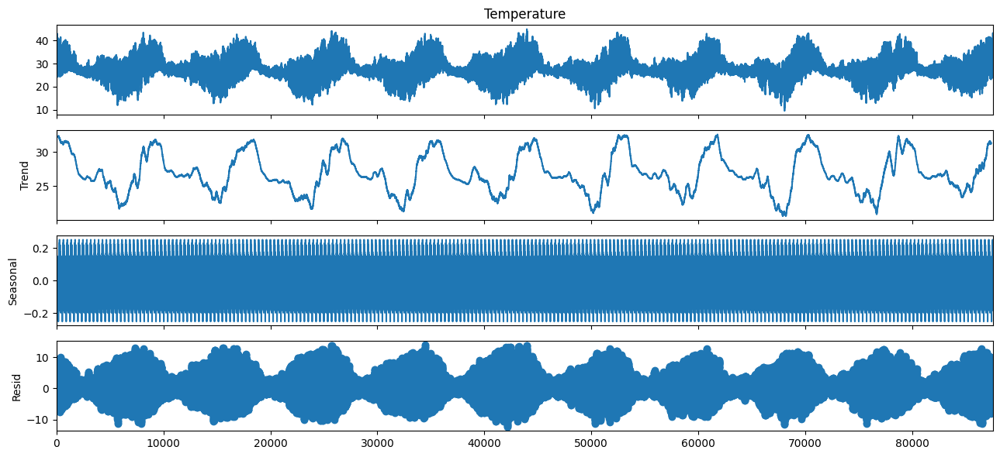

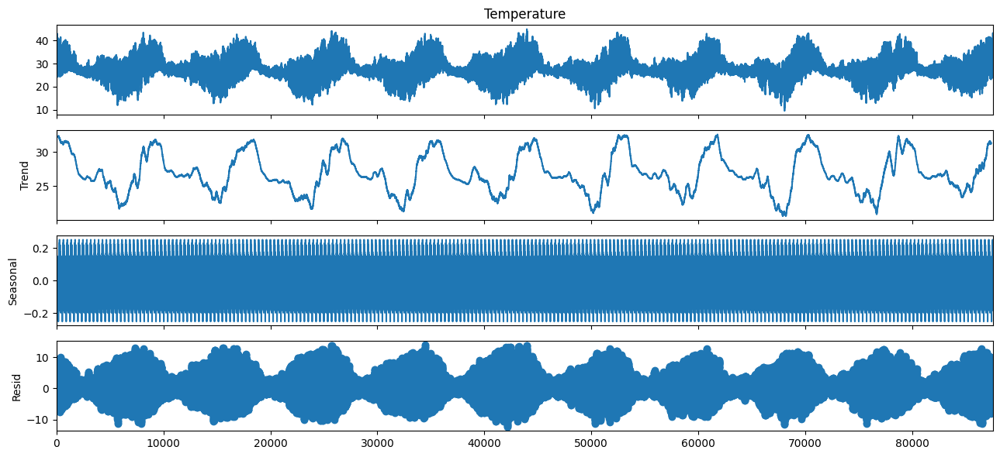

In [ ]:
decompose = seasonal_decompose(dataframe['Temperature'], model = 'additive', period=365)
decompose.plot()

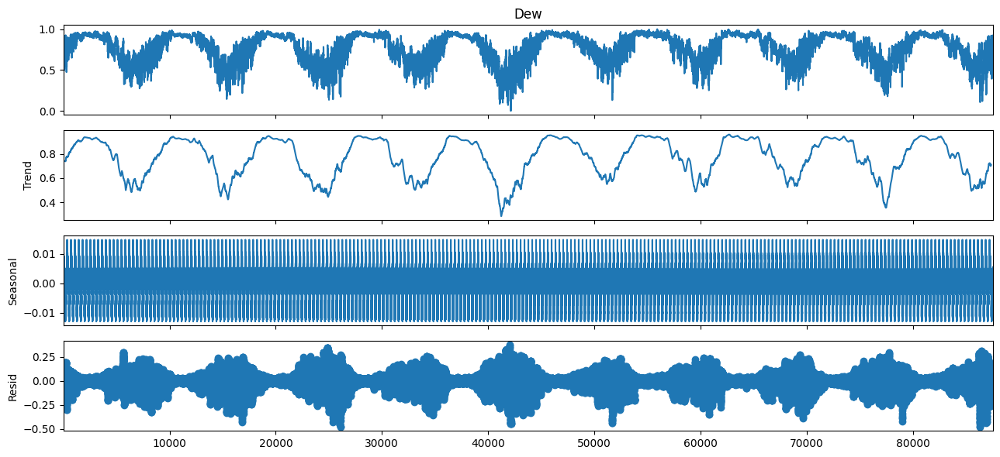

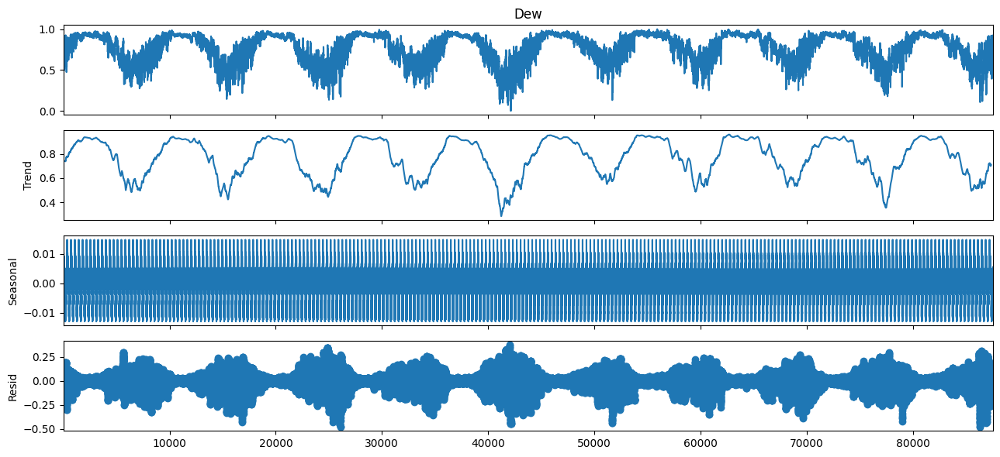

In [ ]:
decompose = seasonal_decompose(dataframe['Dew'], model = 'additive', period=365)
decompose.plot()

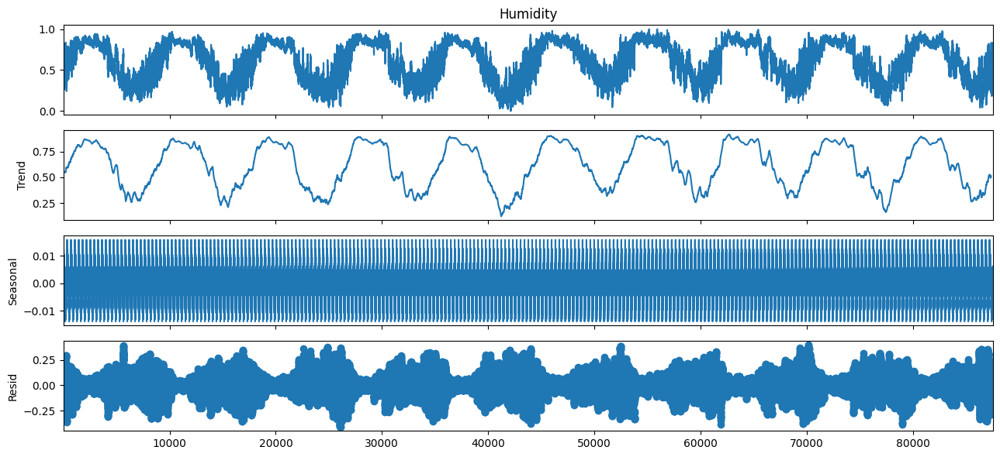

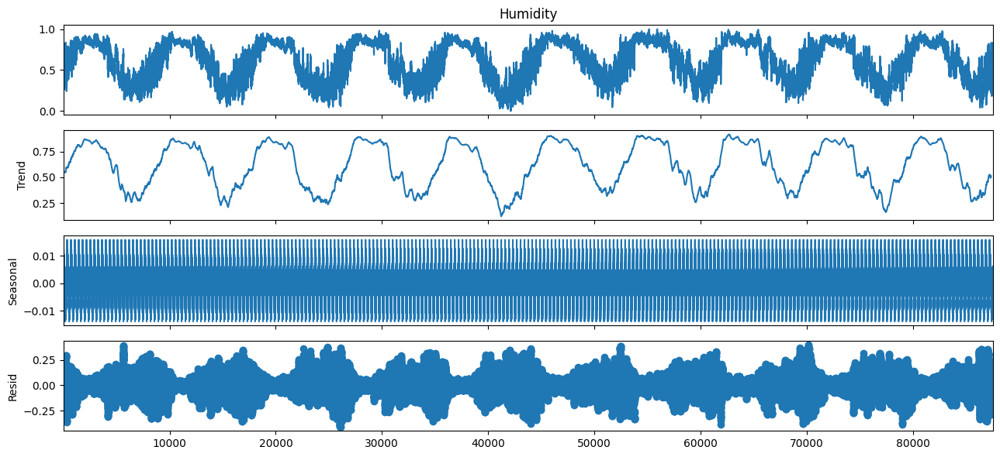

In [ ]:
decompose = seasonal_decompose(dataframe['Humidity'], model = 'additive', period=365)
decompose.plot()

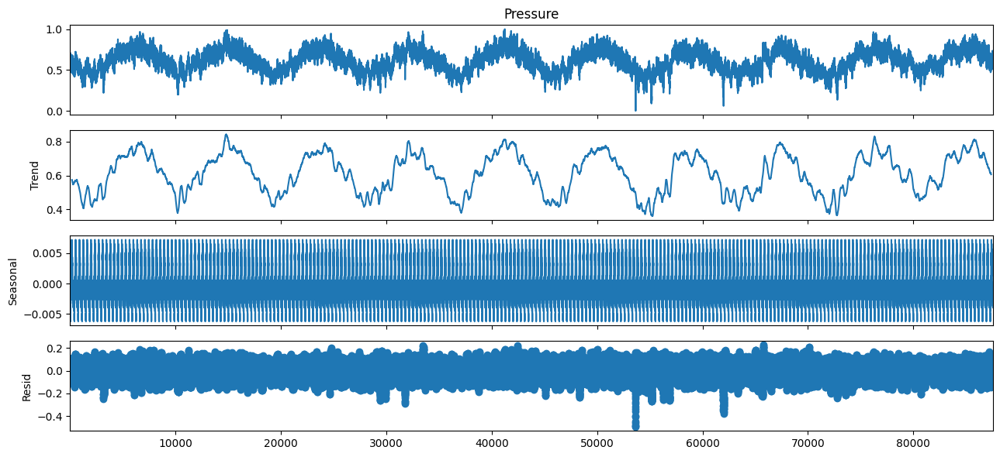

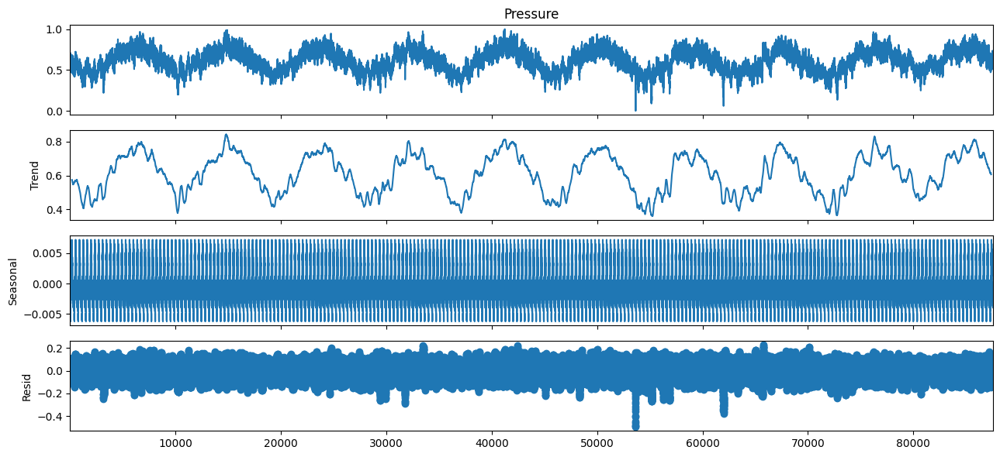

In [ ]:
decompose = seasonal_decompose(dataframe['Pressure'], model = 'additive', period=365)
decompose.plot()

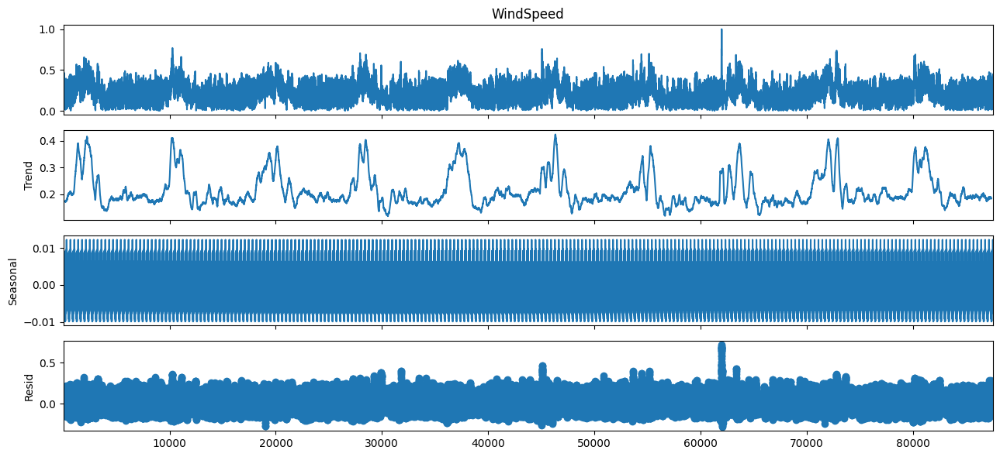

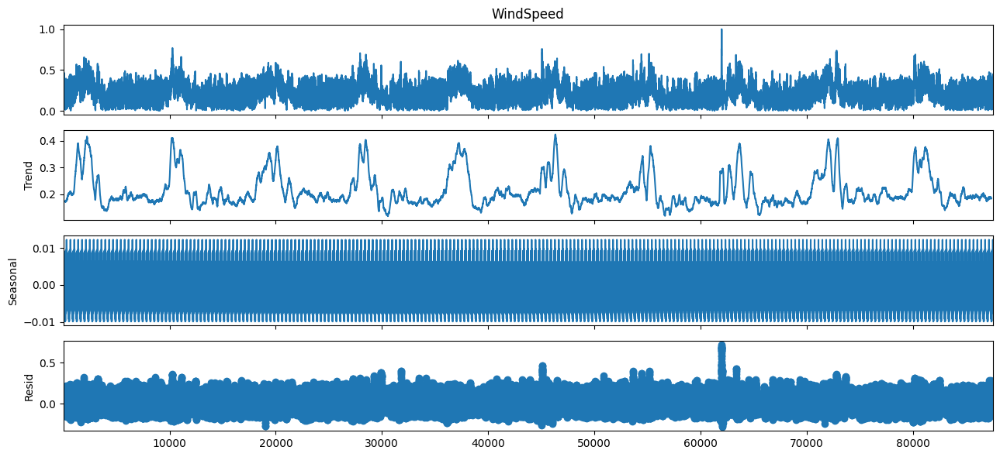

In [ ]:
decompose = seasonal_decompose(dataframe['WindSpeed'], model = 'additive', period=365)
decompose.plot()

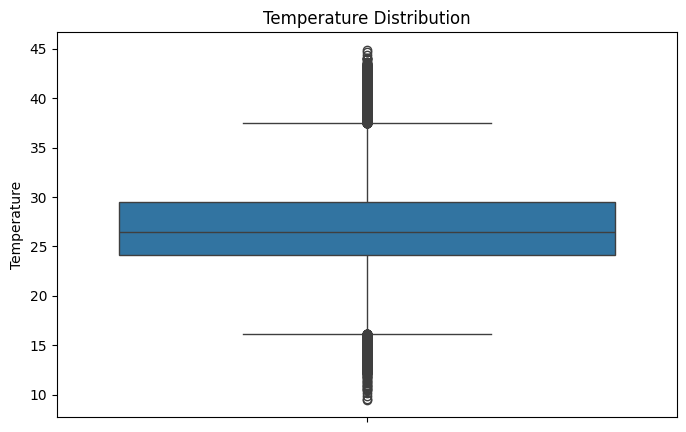

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(df['Temperature'])
plt.title('Temperature Distribution')
plt.show()

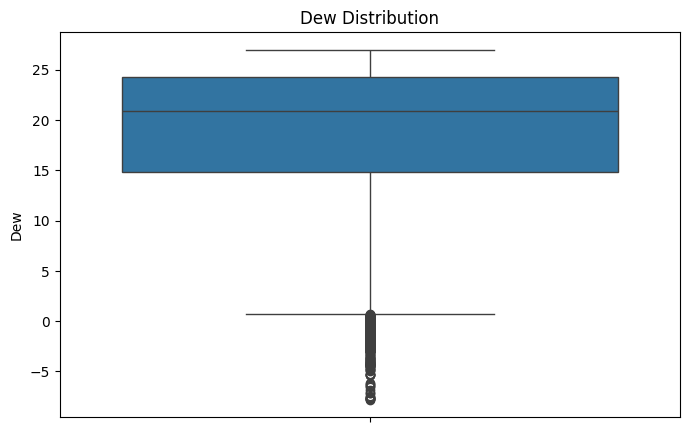

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(df['Dew'])
plt.title('Dew Distribution')
plt.show()

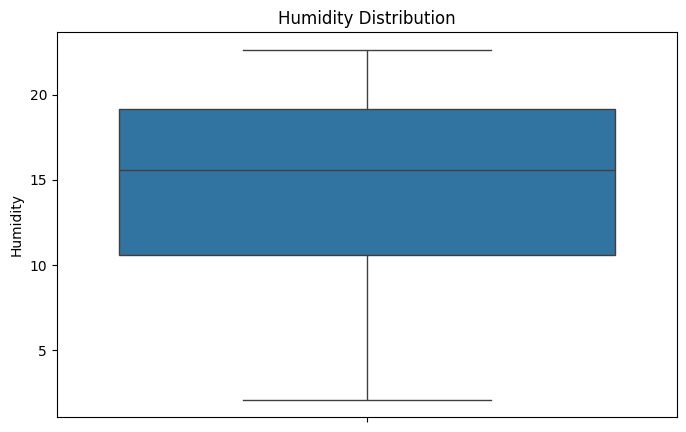

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(df['Humidity'])
plt.title('Humidity Distribution')
plt.show()

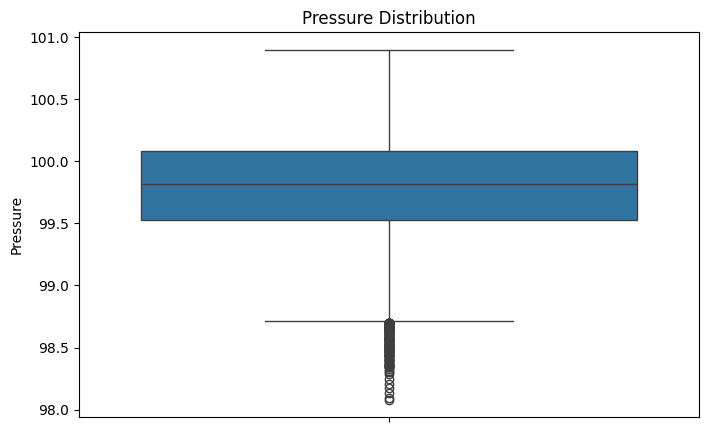

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(df['Pressure'])
plt.title('Pressure Distribution')
plt.show()

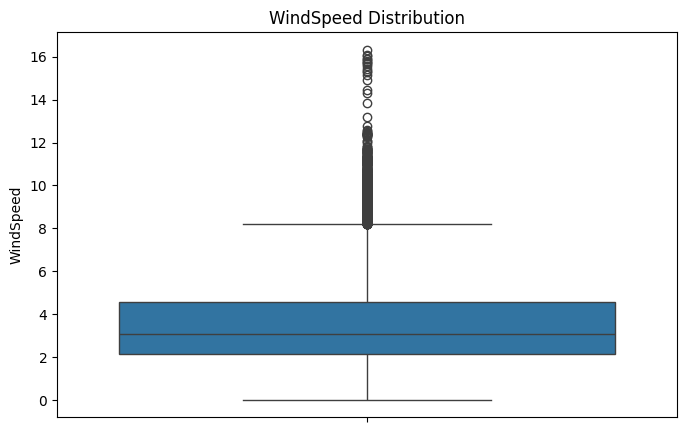

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(df['WindSpeed'])
plt.title('WindSpeed Distribution')
plt.show()

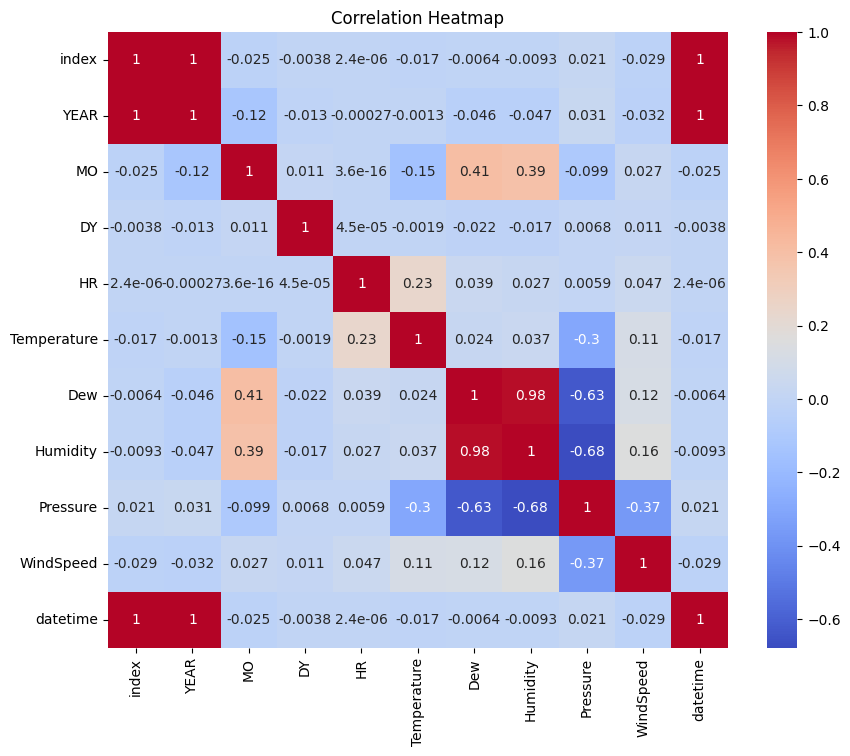

In [ ]:
correlation_matrix = df.corr()

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()



---



**DESIGNING THE MODEL**

Epoch 1/50
2189/2189 [==============================] - 33s 14ms/step - loss: 0.0073
Epoch 2/50
2189/2189 [==============================] - 30s 14ms/step - loss: 0.0019
Epoch 3/50
2189/2189 [==============================] - 31s 14ms/step - loss: 0.0010
Epoch 4/50
2189/2189 [==============================] - 31s 14ms/step - loss: 8.4392e-04
Epoch 5/50
2189/2189 [==============================] - 31s 14ms/step - loss: 7.9440e-04
Epoch 6/50
2189/2189 [==============================] - 31s 14ms/step - loss: 7.7170e-04
Epoch 7/50
2189/2189 [==============================] - 30s 14ms/step - loss: 7.5061e-04
Epoch 8/50
2189/2189 [==============================] - 30s 14ms/step - loss: 7.3345e-04
Epoch 9/50
2189/2189 [==============================] - 30s 14ms/step - loss: 7.3444e-04
Epoch 10/50
2189/2189 [==============================] - 31s 14ms/step - loss: 7.2195e-04
Epoch 11/50
2189/2189 [==============================] - 30s 14ms/step - loss: 7.1676e-04
Epoch 12/50
2189/2189 [========

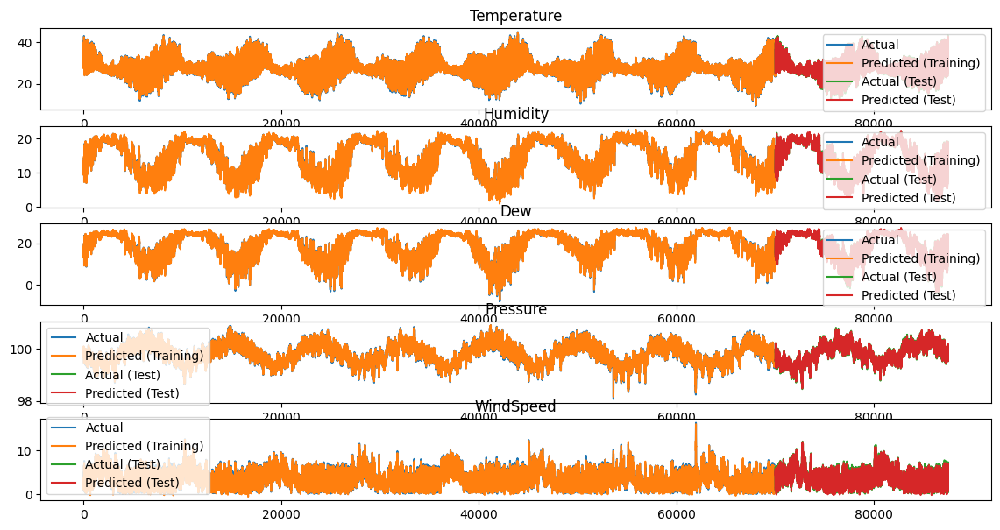

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

dataframe.set_index('index', inplace=True)


# Select features to be predicted
features = ['Temperature', 'Humidity', 'Dew', 'Pressure', 'WindSpeed']

# Normalize the data
scalers = {}
for feature in features:
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataframe[feature] = scaler.fit_transform(dataframe[feature].values.reshape(-1, 1))
    scalers[feature] = scaler

# Define function to create dataset with lookback
def create_dataset(dataframe, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataframe) - look_back):
        a = dataframe[i:(i + look_back), :]
        dataX.append(a)
        dataY.append(dataframe[i + look_back, :])
    return np.array(dataX), np.array(dataY)

# Set lookback window size
look_back = 24  # You can adjust this window size

# Prepare the dataset
dataframe_values = dataframe[features].values
train_size = int(len(dataframe_values) * 0.8)  # 80% of data for training
train, test = dataframe_values[0:train_size, :], dataframe_values[train_size:len(dataframe_values), :]
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

# Define the LSTM model
model = Sequential()
model.add(LSTM(units=50, input_shape=(look_back, len(features))))
model.add(Dropout(0.2))
model.add(Dense(units=len(features)))
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(trainX, trainY, epochs=50, batch_size=32)

# Make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

# Invert predictions to original scale
trainPredict = np.array([scalers[feature].inverse_transform(trainPredict[:, i].reshape(-1, 1)) for i, feature in enumerate(features)])
trainY_inv = np.array([scalers[feature].inverse_transform(trainY[:, i].reshape(-1, 1)) for i, feature in enumerate(features)])
testPredict = np.array([scalers[feature].inverse_transform(testPredict[:, i].reshape(-1, 1)) for i, feature in enumerate(features)])
testY_inv = np.array([scalers[feature].inverse_transform(testY[:, i].reshape(-1, 1)) for i, feature in enumerate(features)])

# Plot the results
plt.figure(figsize=(14, 7))
for i, feature in enumerate(features):
    plt.subplot(len(features), 1, i+1)
    plt.plot(trainY_inv[i], label='Actual')
    plt.plot(trainPredict[i], label='Predicted (Training)')
    plt.plot(np.arange(len(trainY_inv[i]), len(trainY_inv[i]) + len(testY_inv[i])), testY_inv[i], label='Actual (Test)')
    plt.plot(np.arange(len(trainPredict[i]), len(trainPredict[i]) + len(testPredict[i])), testPredict[i], label='Predicted (Test)')
    plt.title(feature)
    plt.legend()
plt.show()




---



**MODEL EVALUATION**

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Make predictions on the test set
test_predictions = model.predict(testX)

# Invert predictions to original scale
test_predictions_inv = np.array([scalers[feature].inverse_transform(test_predictions[:, i].reshape(-1, 1)) for i, feature in enumerate(features)])

# Invert actual values to original scale
testY_inv = np.array([scalers[feature].inverse_transform(testY[:, i].reshape(-1, 1)) for i, feature in enumerate(features)])

# Calculate evaluation metrics for each feature
evaluation_metrics = {}

for i, feature in enumerate(features):
    # Calculate Mean Absolute Error (MAE)
    mae = mean_absolute_error(testY_inv[i], test_predictions_inv[i])

    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(testY_inv[i], test_predictions_inv[i])

    # Add metrics to dictionary
    evaluation_metrics[feature] = {'MAE': mae, 'MSE': mse}

# Print evaluation metrics
print("Evaluation Metrics:")
for feature, metrics in evaluation_metrics.items():
    print(f"{feature}:")
    print(f"  MAE: {metrics['MAE']}")
    print(f"  MSE: {metrics['MSE']}")


547/547 [==============================] - 4s 7ms/step
Evaluation Metrics:
Temperature:
  MAE: 0.23051220175781892
  MSE: 0.10194431494595536
Humidity:
  MAE: 0.1722700092557596
  MSE: 0.06752434168165772
Dew:
  MAE: 0.25687960671226107
  MSE: 0.15175893243759372
Pressure:
  MAE: 0.018251817875254275
  MSE: 0.0005475294075418114
WindSpeed:
  MAE: 0.19523366635107472
  MSE: 0.07648718534022692




---



**FORECASTING USING TRAINED MODEL**

In [ ]:
import numpy as np

def predict_weather_for_next_hours(model, test_data, look_back, features, scalers, num_hours):
    # Get the last look_back hours of data from your test set
    last_hours = test_data[-look_back:]

    # Reshape the data to match the input shape of your LSTM model
    last_hours = last_hours.reshape(1, look_back, len(features))

    # Make predictions for the next 'num_hours' hours
    next_hours_predictions = []

    for _ in range(num_hours):
        # Predict the next hour's values
        next_hour_prediction = model.predict(last_hours)

        # Invert predictions to original scale
        next_hour_prediction_inv = np.array([scalers[feature].inverse_transform(next_hour_prediction[:, i].reshape(-1, 1)) for i, feature in enumerate(features)])

        # Append the prediction to the list of predictions
        next_hours_predictions.append(next_hour_prediction_inv)

        # Update last_hours by removing the oldest hour and adding the predicted hour
        last_hours = np.roll(last_hours, -1, axis=1)
        last_hours[0, -1] = next_hour_prediction

    # Return hourly predictions for the next 'num_hours' hours
    return next_hours_predictions

# Example usage:
num_hours = int(input("Enter the number of hours for prediction (1 to 24): "))
if num_hours < 1 or num_hours > 24:
    print("Invalid input. Please enter a number between 1 and 24.")
else:
    predictions = predict_weather_for_next_hours(model, test, look_back, features, scalers, num_hours)
    print("Hourly predictions for the next", num_hours, "hours:")
    for hour, preds in enumerate(predictions):
        print("Hour", hour + 1, ":")
        for i, feature in enumerate(features):
            print(f"{feature}: {preds[i][0][0]}")


Enter the number of hours for prediction (1 to 24): 23
1/1 [==============================] - 0s 22ms/step
Hourly predictions for the next 23 hours:
Hour 1 :
Temperature: 28.397367477416992
Humidity: 14.079707145690918
Dew: 19.057037353515625
Pressure: 99.81378173828125
WindSpeed: 2.2280051708221436
Hour 2 :
Temperature: 28.476823806762695
Humidity: 14.130997657775879
Dew: 19.15937042236328
Pressure: 99.87413024902344
WindSpeed: 2.345308303833008
Hour 3 :
Temperature: 30.111129760742188
Humidity: 13.028685569763184
Dew: 17.771968841552734
Pressure: 99.9239730834961
WindSpeed: 2.401793956756592
Hour 4 :
Temperature: 33.02766036987305
Humidity: 11.220516204833984
Dew: 15.58779239654541
Pressure: 99.98119354248047
WindSpeed: 2.3125696182250977
Hour 5 :
Temperature: 35.7650260925293
Humidity: 9.840965270996094
Dew: 13.628423690795898
Pressure: 100.04206848144531
WindSpeed: 2.126201868057251
Hour 6 :
Temperature: 37.42630386352539
Humidity: 9.117959976196289
Dew: 12.478416442871094
Pressure